In [1]:
%cd ..

d:\github\ripple_heterogeneity\python


In [2]:
import pandas as pd
import numpy as np 
import glob
import matplotlib.pyplot as plt

import hdf5storage
import h5py
import scipy.io as sio

import sys,os

import functions,loading

import nelpy as nel  # main nelpy imports
import nelpy.plotting as npl  # optional plotting import

import math


C:\Users\Cornell\anaconda3\envs\ripple_diversity\lib\site-packages\nelpy\plotting\decoding.py:9: MatplotlibDeprecationWarning: 
The mpl_toolkits.axes_grid module was deprecated in Matplotlib 2.1 and will be removed two minor releases later. Use mpl_toolkits.axes_grid1 and mpl_toolkits.axisartist, which provide the same functionality instead.


# update paths to new lab drive

In [60]:
def update_path(df,project_key,new_path):
    temp_df = df.loc[df['basepath'].str.contains(project_key, case=False)]

    updated = []
    for row_df in temp_df.itertuples():
        parts = row_df.basepath.split(os.sep)
        updated.append(os.path.join(new_path,parts[-2],parts[-1]))
        if not os.path.exists(updated[-1]):
            print('bad path: '+updated[-1])  
    df.loc[df['basepath'].str.contains(project_key, case=False),'basepath'] = updated
    return df

df = pd.read_csv(r'D:\projects\ripple_heterogeneity\sessions.csv')

# AYA
df = update_path(df,"AYA",'Z:\Data\AYAold')

# GirardeauG 
df = update_path(df,"GirardeauG",'Z:\Data\GirardeauG')

# Kenji
df = update_path(df,"Kenji",'Z:\Data')

# GrosmarkAD
df = update_path(df,"GrosmarkAD",'Z:\Data\GrosmarkAD')

# ORproject
df = update_path(df,"ORproject",'Z:\Data\ORproject')

# OMLproject
df = update_path(df,"OptoMECLEC",'Z:\Data\OMLproject')


In [96]:
df.to_csv('Z:/home/ryanh/projects/ripple_heterogeneity/sessions.csv')

In [97]:
os.path.basename('Z:/home/ryanh/projects/ripple_heterogeneity/sessions.csv')


'sessions.csv'

# verify data contents by loading standard data types

In [90]:
def load_basic_data(basepath):
    nChannels, fs, fs_dat, shank_to_channel = functions.loadXML(basepath)
    ripples = loading.load_ripples_events(basepath)
    if 'start' not in ripples:
        print("no ripples: ",basepath)

    cell_metrics,data = loading.load_cell_metrics(basepath)
    if 'ripple_particip' not in cell_metrics:
        print("no ripple cell metrics: ",basepath)

    theta_rem_shift_df,theta_rem_shift_data_dict = loading.load_theta_rem_shift(basepath)
    if 'rem_shift' not in theta_rem_shift_df:
        print("no theta_rem_shift: ",basepath)


    SleepState_states_dict = loading.load_SleepState_states(basepath)
    if "wake_id" not in SleepState_states_dict:
        print("no SleepState_states_dict: ",basepath)

    return cell_metrics,data,ripples,fs_dat,theta_rem_shift_df,theta_rem_shift_data_dict,SleepState_states_dict

for basepath in df.basepath:
    load_basic_data(basepath)

no ripple cell metrics:  Z:\Data\GirardeauG\Rat08\Rat08-20130710
no ripple cell metrics:  Z:\Data\GirardeauG\Rat08\Rat08-20130711
no ripple cell metrics:  Z:\Data\GirardeauG\Rat08\Rat08-20130712
no ripple cell metrics:  Z:\Data\GirardeauG\Rat09\Rat09-20140324
no ripple cell metrics:  Z:\Data\GirardeauG\Rat09\Rat09-20140325
no ripple cell metrics:  Z:\Data\GirardeauG\Rat09\Rat09-20140326
no ripple cell metrics:  Z:\Data\GirardeauG\Rat09\Rat09-20140327
no ripple cell metrics:  Z:\Data\GirardeauG\Rat09\Rat09-20140329
no theta_rem_shift:  Z:\Data\GirardeauG\Rat09\Rat09-20140329
no theta_rem_shift:  Z:\Data\GirardeauG\Rat09\Rat09-20140331
no ripple cell metrics:  Z:\Data\GirardeauG\Rat09\Rat09-20140401
no theta_rem_shift:  Z:\Data\GirardeauG\Rat09\Rat09-20140401
no ripple cell metrics:  Z:\Data\GirardeauG\Rat09\Rat09-20140402
no theta_rem_shift:  Z:\Data\GirardeauG\Rat09\Rat09-20140402
no ripple cell metrics:  Z:\Data\GirardeauG\Rat09\Rat09-20140403
no theta_rem_shift:  Z:\Data\GirardeauG\R

In [65]:
basepath = 'Z:\Data\OMLproject\OML10\day5'
cell_metrics,data,ripples,fs_dat,theta_rem_shift_df,theta_rem_shift_data_dict,SleepState_states_dict = load_basic_data(basepath)

In [92]:
df.loc[df['basepath'].str.contains("ORproject", case=False)]


,basepath,basename
213,Z:\Data\ORproject\OR15\day1,day1
214,Z:\Data\ORproject\OR15\day10,day10
215,Z:\Data\ORproject\OR15\day2,day2
216,Z:\Data\ORproject\OR15\day3,day3
217,Z:\Data\ORproject\OR15\day4,day4
218,Z:\Data\ORproject\OR18\day1,day1
219,Z:\Data\ORproject\OR18\day2,day2
220,Z:\Data\ORproject\OR18\day3,day3
221,Z:\Data\ORproject\OR21\day2,day2
222,Z:\Data\ORproject\OR21\day4,day4


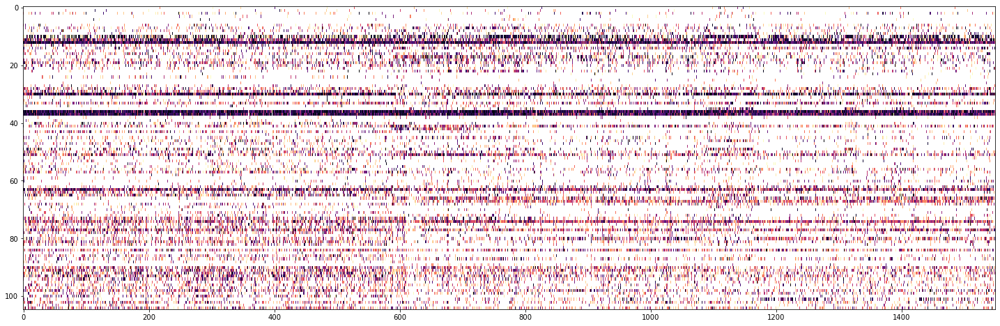

In [102]:
def load_rankStats(basepath):

    filename = glob.glob(basepath+os.sep+'*rankStats.mat')[0]
    
    # check if saved file exists
    if not os.path.exists(filename):
        warnings.warn("file does not exist")
        return pd.DataFrame()

    data = sio.loadmat(filename)
    rank_order = np.nanmedian(data['rankStats']['rankUnits'][0][0],axis=1)

    # df = pd.DataFrame()
    return data

basepath = r'A:\Data\AB1\day1'
data = load_rankStats(basepath)
plt.figure(figsize=(25,8))
plt.imshow(data['rankStats']['rankUnits'][0][0],aspect='auto',cmap='magma', interpolation='nearest')


<ipython-input-121-677abfec8d9a>:8: RuntimeWarning: Mean of empty slice


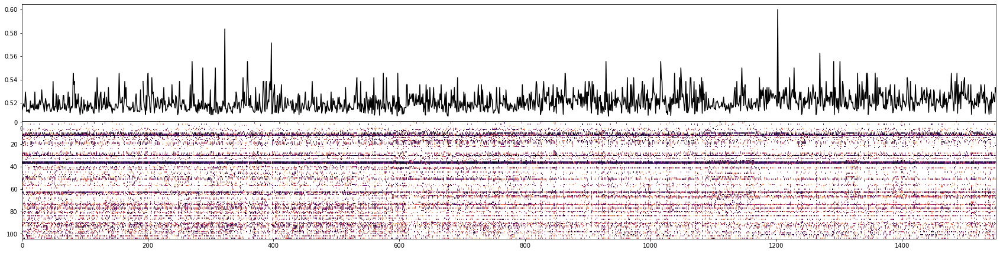

In [121]:
def range_of_vals(x, axis=0):
    return np.nanmax(x, axis=axis) - np.nanmin(x, axis=axis)

fig, axs = plt.subplots(2,1, figsize=functions.set_size('thesis', fraction=5, subplots=(2, 5)), edgecolor='k')
fig.subplots_adjust(hspace = 0, wspace=.1)
axs = axs.ravel()

axs[0].plot(np.nanmean(data['rankStats']['rankUnits'][0][0],axis=0),'k')
axs[0].autoscale(enable=True, axis='x', tight=True)

axs[1].imshow(data['rankStats']['rankUnits'][0][0],aspect='auto',cmap='magma', interpolation='nearest')


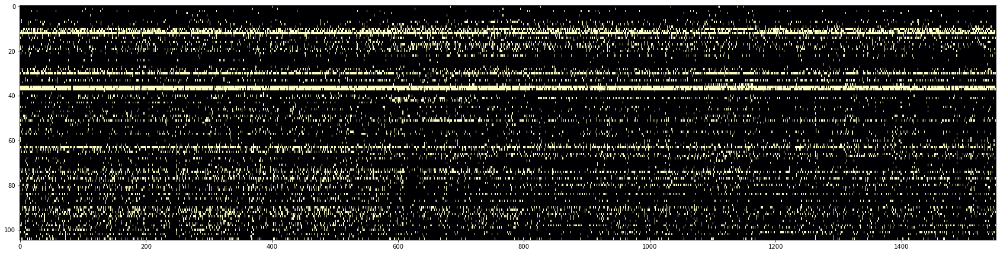

In [129]:
plt.figure(figsize=functions.set_size('thesis', fraction=5, subplots=(2, 5)), edgecolor='k')

plt.imshow(data['rankStats']['rankUnits'][0][0]<.5,aspect='auto',cmap='magma', interpolation='nearest')


# load cell metrics

In [3]:
filename = 'A:/Data/Kenji/ec013.540_561/ec013.540_561.cell_metrics.cellinfo.mat'

df,data = functions.load_cell_metrics(filename)
display(df.head())
print(data.keys())

,UID,ab_ratio,acg_asymptote,acg_c,acg_d,acg_fit_rsquare,acg_h,acg_refrac,acg_tau_burst,acg_tau_decay,...,trilat_y,troughToPeak,troughtoPeakDerivative,basename,basepath,sex,species,strain,geneticLine,cellCount
0,1,0.332710,0.601433,14.408824,2.540505,0.259941,22.853461,9.984846,4.074157,5.190860,...,-34.363568,0.23,0.15,ec013.540_561,A:\Data\Kenji\ec013.540_561,Male,Rat,Long Evans,Wild type,88
1,2,0.269982,7.340904,8.113168,4.658616,0.873546,23.689211,3.013510,1.608141,19.391276,...,-28.168134,0.27,0.17,ec013.540_561,A:\Data\Kenji\ec013.540_561,Male,Rat,Long Evans,Wild type,88
2,3,-0.310621,-3.664141,17.082819,1.496071,0.886190,27.043742,5.092623,1.927423,107.494177,...,-34.947582,0.46,0.19,ec013.540_561,A:\Data\Kenji\ec013.540_561,Male,Rat,Long Evans,Wild type,88
3,4,-0.248032,3.026403,6.292553,2.999373,0.723261,16.945979,5.593262,1.485837,19.434022,...,-22.719008,0.44,0.20,ec013.540_561,A:\Data\Kenji\ec013.540_561,Male,Rat,Long Evans,Wild type,88
4,5,-0.278485,4.534593,14.184590,1.612977,0.736797,7.777361,2.671208,0.954870,4.112831,...,-34.185602,0.49,0.19,ec013.540_561,A:\Data\Kenji\ec013.540_561,Male,Rat,Long Evans,Wild type,88


dict_keys(['acg_wide', 'acg_narrow', 'acg_log10', 'ripple_fr', 'chanCoords_x', 'chanCoords_y', 'epochs', 'spikes', 'waveforms'])


# load xml and position

In [4]:
nChannels, fs, fs_dat, shank_to_channel = functions.loadXML(df.basepath[0])
position,fs_pos = functions.load_position(df.basepath[0]) 

# put into nelpy objects

In [5]:
epochs = nel.EpochArray([np.array([data['epochs'].startTime,data['epochs'].stopTime]).T])
for ep,name in zip(epochs,data['epochs'].name):
    print(name,ep.duration)
st = nel.SpikeTrainArray(timestamps=np.array(data['spikes'],dtype="object"), support=epochs, fs=fs_dat)
pos = nel.AnalogSignalArray(data=[position.x1, position.y1],support=epochs, fs=fs_pos)
print(st)
print(pos)



ec013.540_sleep 59:50:554 minutes
ec013.541_Mwheel 2:17:300 minutes
ec013.542_Mwheel 25:25:350 minutes
ec013.543_Mwheel 1:59:603 minutes
ec013.544_Mwheel 29.1 seconds
ec013.545_Mwheel 12:04:100 minutes
ec013.546_sleep 19:07:699 minutes
ec013.547_sleep 59:16:100 minutes
ec013.548_sleep 18:07:300 minutes
ec013.549_sleep 33:16:800 minutes
ec013.550_sleep 7:16:224 minutes
ec013.551_sleep 12:57:830 minutes
ec013.552_bigSquare 19:56:032 minutes
ec013.553_bigSquare 41:44:294 minutes
ec013.554_linear 17:12:602 minutes
ec013.555_linear 18:12:403 minutes
ec013.556_linear 12:58:649 minutes
ec013.557_sleep 5:26:041 minutes
ec013.558_sleep 2:18:444 minutes
ec013.559_sleep 46:54:362 minutes
ec013.560_sleep 9:14:598 minutes
ec013.561_sleep 13:55:800 minutes


C:\Users\Cornell\anaconda3\envs\ripple_diversity\lib\site-packages\nelpy\core\_eventarray.py:709: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


<SpikeTrainArray at 0x1e7fa2984c0: 88 units (22 segments)> at 20000 Hz
<AnalogSignalArray at 0x1e7f6e1b760: 2 signals (22 segments)> for a total of 7:20:01:188 hours


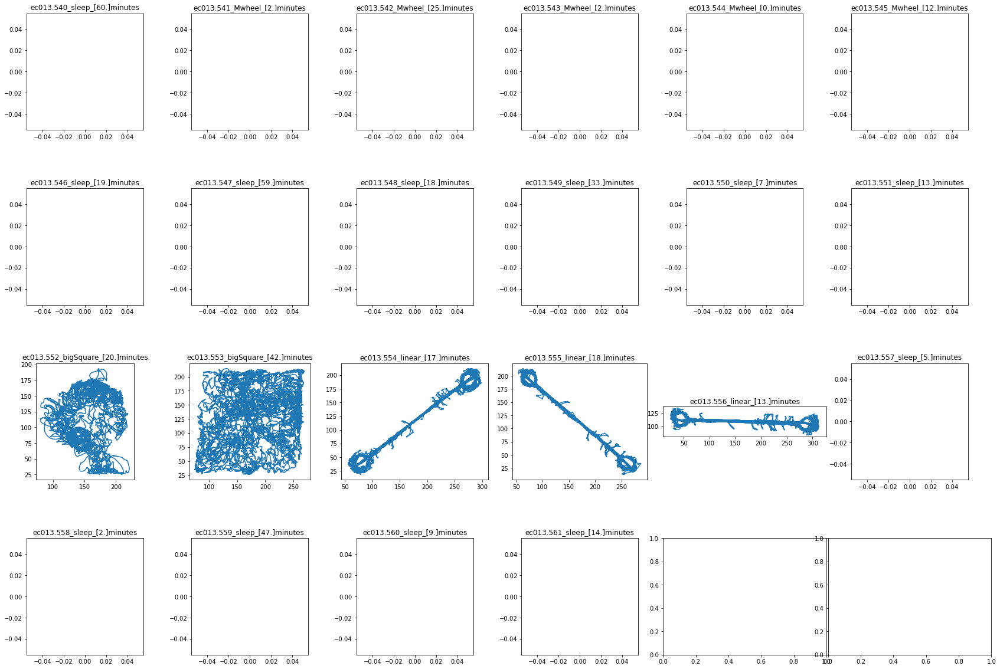

In [6]:
import warnings
warnings.filterwarnings("ignore")

n_columns = 6
n_rows = math.ceil(len(pos)/n_columns) 

fig, axs = plt.subplots(n_rows,n_columns, figsize=(30, 20), edgecolor='k')
fig.subplots_adjust(hspace = 0.5, wspace=0.01)
axs = axs.ravel()

for i,p in enumerate(pos):
    axs[i].plot(p.data[0],p.data[1])
    axs[i].set_title(data['epochs'].name[i] + '_' + str(np.round(p.lengths/fs_pos/60))+ 'minutes')
    axs[i].set_aspect('equal')

In [89]:
def get_1d_tuning_curves(
    pos, # nelpy pos object
    st, # nelpy spike train object
    epoch_num, # number of epoch you want to look at
    speed_sigma=0.1, # sigma for smoothing speed in seconds
    v=5, # speed filter for runs 
    fs_pos=39.0625, # sampling rate of tracking data
    ds_run=0.5,
    ds_bins=0.05,
    bst_sigma=0.3, # 300 ms spike smoothing
    tc_sigma = 2, # smoothing std dev in cm
    cm_per_bin=4,
    plot_fig=False
    ):
    
    x,y = functions.linearize_position(pos[epoch_num].data[0,:],pos[epoch_num].data[1,:])

    pos1d = nel.AnalogSignalArray(x,
                                timestamps=pos[epoch_num].time,
                                support=pos[epoch_num].support,
                                fs=fs_pos
                                )
    
    # compute and smooth speed of linearized position
    speed1 = nel.utils.ddt_asa(pos1d, smooth=True, sigma=speed_sigma, norm=True)

    # find epochs where the animal ran at least as fast as xcm per second
    run_epochs = nel.utils.get_run_epochs(speed1, v1=v,v2=v)
    
    # restrict spike trains to those epochs during which the animal was running
    st_run = st[run_epochs]

    # smooth and re-bin:
    bst_run = st_run.bin(ds=ds_bins).smooth(sigma=bst_sigma, inplace=True).rebin(w=ds_run/ds_bins)

    tc = nel.TuningCurve1D(bst=bst_run,
                            extern=pos1d,
                            n_extern=int(np.round((np.nanmax(pos1d.data)-np.nanmin(pos1d.data))/cm_per_bin)),
                            extmin=np.nanmin(pos1d.data),
                            extmax=np.nanmax(pos1d.data),
                            sigma=tc_sigma,
                            min_duration=0)
    if plot_fig:
        # set criteria for units used in decoding
        min_peakfiringrate = 1 # Hz
        max_avgfiringrate = 20 # Hz
        peak_to_mean_ratio_threshold = 1.5 # peak firing rate should be greater than 3.5 times mean firing rate

        # unimodal_cells = find_unimodal_tuningcurves1D(smoothed_rate, peakthresh=0.5)

        # enforce minimum peak firing rate
        unit_ids_to_keep = set(
            np.asanyarray(tc.unit_ids)[np.argwhere(tc.ratemap.max(axis=1)>min_peakfiringrate).squeeze().tolist()]
            )
        # enforce maximum average firing rate
        unit_ids_to_keep = unit_ids_to_keep.intersection(
            set( np.asanyarray(tc.unit_ids)[np.argwhere(tc.ratemap.mean(axis=1)<max_avgfiringrate).squeeze().tolist()])
            )

        # enforce peak to mean firing ratio
        peak_firing_rates = tc.max(axis=1)
        mean_firing_rates = tc.mean(axis=1)
        ratio = peak_firing_rates/mean_firing_rates
        unit_ids_to_keep = unit_ids_to_keep.intersection(
            set(np.asanyarray(tc.unit_ids)[np.argwhere(ratio>=peak_to_mean_ratio_threshold).squeeze().tolist()])
            )

        # finally, convert remaining units into a list of indices
        unit_ids_to_keep = list(unit_ids_to_keep)

        # modify spike trains and ratemap to only include those units that passed all the criteria
        sta_placecells = st._unit_subset(unit_ids_to_keep)

        tc = tc._unit_subset(unit_ids_to_keep)

        # reorder cells by peak firing location on track (this is nice for visualization, but doesn't affect decoding)
        tc.reorder_units(inplace=True)

        # with plt.xkcd():
        with npl.palettes.color_palette(npl.colors.rainbow):
            with npl.FigureManager(show=True, nrows=1, ncols=3, figsize=(20,6)) as (fig, axes):
                npl.utils.skip_if_no_output(fig)
                ax0, ax1, ax2 = axes

                npl.plot_tuning_curves1D(tc.smooth(sigma=3), ax=ax0, pad=5.5)
                npl.plot_tuning_curves1D(tc.smooth(sigma=3), ax=ax1, normalize=True, pad=0.9)
                npl.plot_tuning_curves1D(tc.smooth(sigma=3), ax=ax2, pad=0)

                for ax in axes:
                    ax.set_xlabel('position [cm]')
                npl.utils.xticks_interval(25, *axes)
                npl.utils.yticks_interval(5, ax2)
                npl.add_simple_scalebar("10 Hz", ax=ax0, xy=(10, 57), length=10, orientation='v', rotation_text='h', size=14)
                ax0.set_title('True firing rates', size=12)
                ax1.set_title('Normalized firing rates', size=12)
                ax2.set_title('Collapsed units (pad=0)', size=12)
    return tc

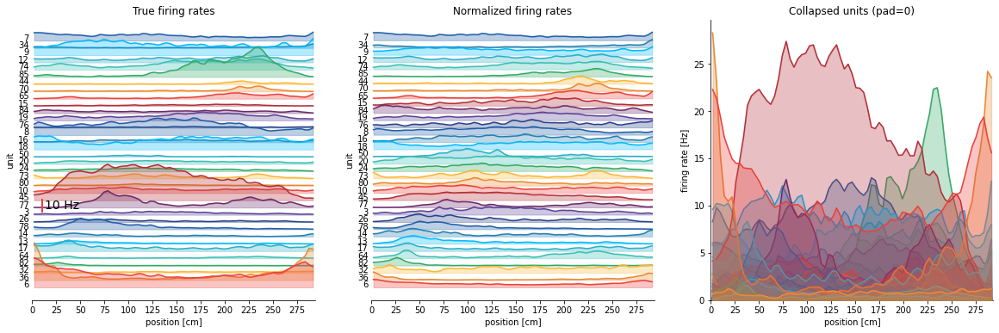

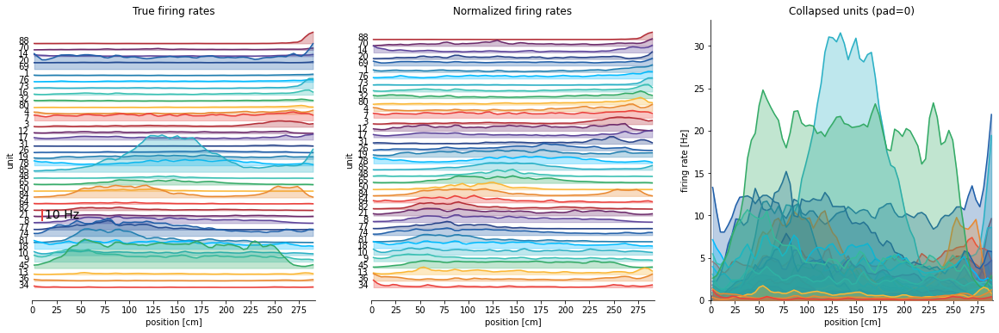

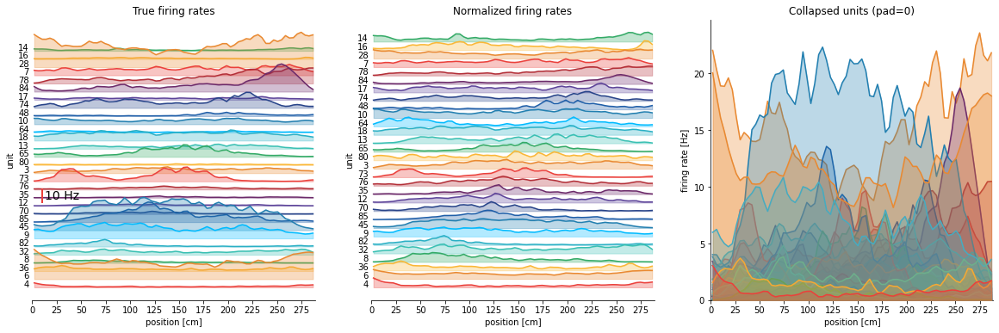

In [88]:
for epoch_num in np.arange(14,17):
    get_1d_tuning_curves(
        pos=pos, # nelpy pos object
        st=st, # nelpy spike train object
        epoch_num=int(epoch_num), # number of epoch you want to look at
        plot_fig=True
    )

In [143]:
tc_1 = get_1d_tuning_curves(
    pos=pos, # nelpy pos object
    st=st, # nelpy spike train object
    epoch_num=int(14), # number of epoch you want to look at
)
tc_2 = get_1d_tuning_curves(
    pos=pos, # nelpy pos object
    st=st, # nelpy spike train object
    epoch_num=int(15), # number of epoch you want to look at
)
tc_3 = get_1d_tuning_curves(
    pos=pos, # nelpy pos object
    st=st, # nelpy spike train object
    epoch_num=int(16), # number of epoch you want to look at
)

In [144]:
def get_place_ids(tc,
    min_peakfiringrate = 1,
    max_avgfiringrate = 20,
    peak_to_mean_ratio_threshold = 1.5 
    ):
    # enforce minimum peak firing rate
    unit_ids_to_keep = set(
        np.asanyarray(tc.unit_ids)[np.argwhere(tc.ratemap.max(axis=1)>min_peakfiringrate).squeeze().tolist()]
        )
    # enforce maximum average firing rate
    unit_ids_to_keep = unit_ids_to_keep.intersection(
        set(np.asanyarray(tc.unit_ids)[np.argwhere(tc.ratemap.mean(axis=1)<max_avgfiringrate).squeeze().tolist()])
        )

    # enforce peak to mean firing ratio
    peak_firing_rates = tc.max(axis=1)
    mean_firing_rates = tc.mean(axis=1)
    ratio = peak_firing_rates/mean_firing_rates
    unit_ids_to_keep = unit_ids_to_keep.intersection(
        set(np.asanyarray(tc.unit_ids)[np.argwhere(ratio>=peak_to_mean_ratio_threshold).squeeze().tolist()])
        )

    # finally, convert remaining units into a list of indices
    return list(unit_ids_to_keep)

unit_ids_to_keep = get_place_ids(tc_1)


In [156]:
tc = tc_1._unit_subset(unit_ids_to_keep)
tc.reorder_units()
idx = tc.get_peak_firing_order_ids()

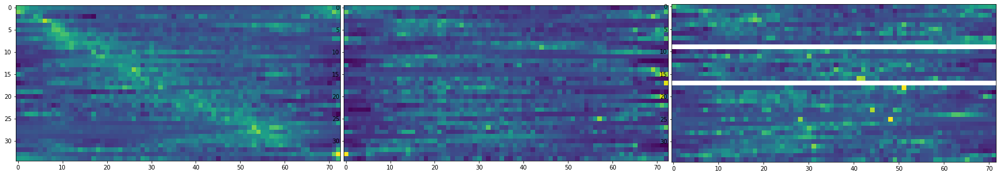

In [166]:
from scipy import stats

fig, axs = plt.subplots(1,3, figsize=(30, 20), edgecolor='k')
fig.subplots_adjust(hspace = 0.5, wspace=0.01)
axs = axs.ravel()

axs[0].imshow(stats.zscore(tc_1.ratemap[np.array(idx)-1],axis=1))
axs[1].imshow(stats.zscore(tc_2.ratemap[np.array(idx)-1],axis=1))
axs[2].imshow(stats.zscore(tc_3.ratemap[np.array(idx)-1],axis=1))


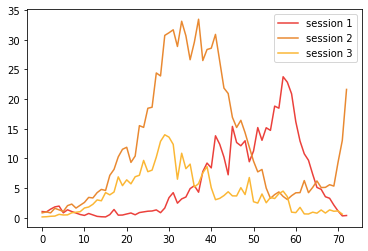

In [169]:
plt.plot(tc_1.ratemap[84],label='session 1')
plt.plot(tc_2.ratemap[84],label='session 2')
plt.plot(tc_3.ratemap[84],label='session 3')
plt.legend()

# make linear track linear

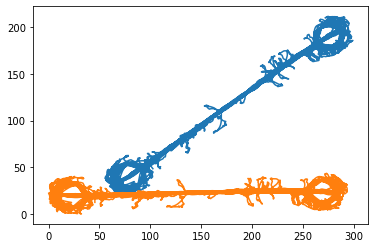

In [7]:
x,y = functions.linearize_position(pos[14].data[0,:],pos[14].data[1,:])

plt.plot(pos[14].data[0,:],pos[14].data[1,:])
plt.plot(x,y)

In [8]:
pos1d = nel.AnalogSignalArray(x, timestamps=pos[14].time, support=pos[14].support, fs=fs_pos)
pos1d

<AnalogSignalArray at 0x1e787263bb0: 1 signals> for a total of 17:12:602 minutes

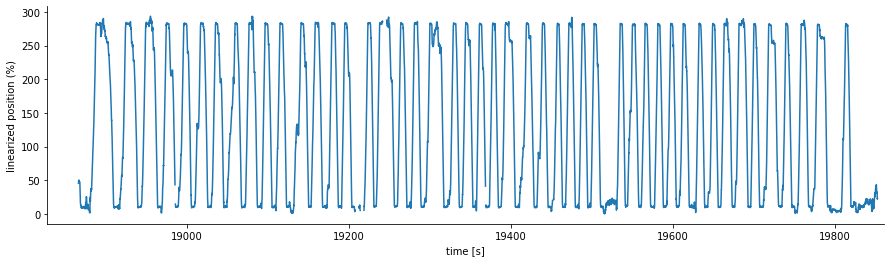

In [9]:
ig = plt.figure(figsize=(15,4))
npl.plot(pos1d)
ax = plt.gca()
ax.set_xlabel('time [s]')
ax.set_ylabel('linearized position (%)')
npl.utils.clear_right(ax)
npl.utils.clear_top(ax)

In [17]:
sigma_100ms = 0.1

# compute and smooth speed of linearized position
speed1 = nel.utils.ddt_asa(pos1d, smooth=True, sigma=sigma_100ms, norm=True)

# find epochs where the animal ran at least as fast as xcm per second
run_epochs = nel.utils.get_run_epochs(speed1, v1=5,v2=5)

print(run_epochs)


<EpochArray at 0x1e789f8df70: 301 epochs> of length 11:46:995 minutes


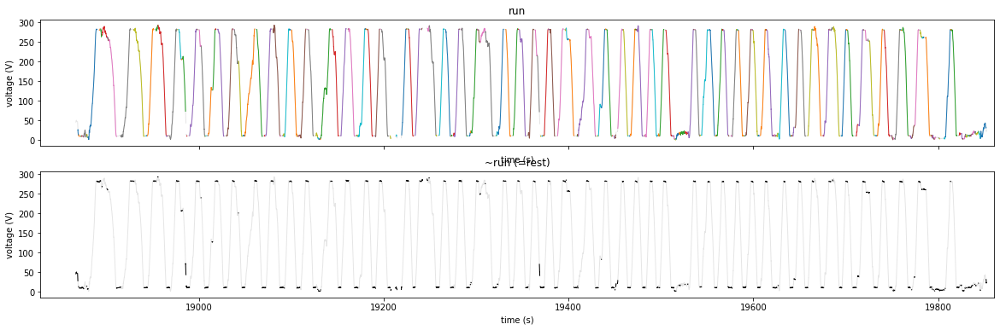

In [18]:
with npl.FigureManager(show=True, nrows=2, figsize=(20,6)) as (fig, axes):
    npl.utils.skip_if_no_output(fig)
    ax0, ax1 = axes
    for ax in axes:
        ax.plot(pos1d.time, pos1d.asarray().yvals, lw=1, alpha=0.2, color='gray')
        ax.set_ylabel('position (%)')
    
    npl.plot(pos1d[run_epochs], ax=ax0, lw=1, label='run')
    npl.plot(pos1d[~run_epochs], ax=ax1, lw=1, label='run', color='k')
    
    npl.utils.no_xticklabels(ax0)
    
    ax0.set_title('run')
    ax1.set_title('~run (=rest)')

In [31]:
st_run = st[run_epochs] # restrict spike trains to those epochs during which the animal was running


In [32]:
ds_run = 0.5 # 100 ms
ds_50ms = 0.05

# smooth and re-bin:
sigma = 0.3 # 300 ms spike smoothing
bst_run = st_run.bin(ds=ds_50ms).smooth(sigma=sigma, inplace=True).rebin(w=ds_run/ds_50ms)

In [54]:
sigma = 0.2 # smoothing std dev in cm
tc = nel.TuningCurve1D(bst=bst_run,
                        extern=pos1d,
                        n_extern=int(np.round((np.nanmax(pos1d.data) - np.nanmin(pos1d.data)) / 4)),
                        extmin=np.nanmin(pos1d.data),
                        extmax=np.nanmax(pos1d.data),
                        sigma=sigma,
                        min_duration=1)

In [55]:
tc = tc.reorder_units()


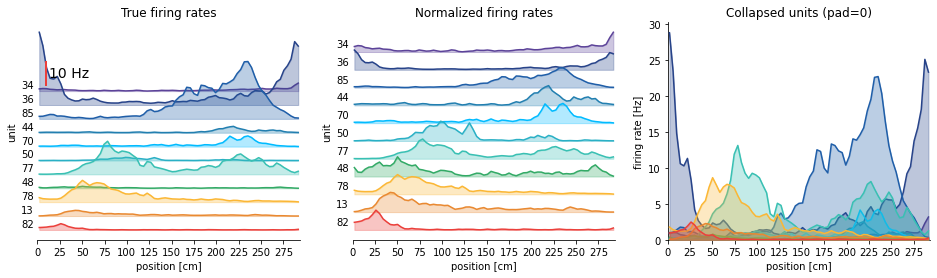

In [62]:
# set criteria for units used in decoding
min_peakfiringrate = 1 # Hz
max_avgfiringrate = 20 # Hz
peak_to_mean_ratio_threshold = 1.5 # peak firing rate should be greater than 3.5 times mean firing rate

# unimodal_cells = find_unimodal_tuningcurves1D(smoothed_rate, peakthresh=0.5)

# enforce minimum peak firing rate
unit_ids_to_keep = set(
    np.asanyarray(tc.unit_ids)[np.argwhere(tc.ratemap.max(axis=1)>min_peakfiringrate).squeeze().tolist()]
    )
# enforce maximum average firing rate
unit_ids_to_keep = unit_ids_to_keep.intersection(
    set( np.asanyarray(tc.unit_ids)[np.argwhere(tc.ratemap.mean(axis=1)<max_avgfiringrate).squeeze().tolist()])
    )

# enforce peak to mean firing ratio
peak_firing_rates = tc.max(axis=1)
mean_firing_rates = tc.mean(axis=1)
ratio = peak_firing_rates/mean_firing_rates
unit_ids_to_keep = unit_ids_to_keep.intersection(
    set(np.asanyarray(tc.unit_ids)[np.argwhere(ratio>=peak_to_mean_ratio_threshold).squeeze().tolist()])
    )


# finally, convert remaining units into a list of indices
unit_ids_to_keep = list(unit_ids_to_keep)

# modify spike trains and ratemap to only include those units that passed all the criteria
sta_placecells = st._unit_subset(unit_ids_to_keep)

tc = tc._unit_subset(unit_ids_to_keep)

# reorder cells by peak firing location on track (this is nice for visualization, but doesn't affect decoding)
tc.reorder_units(inplace=True)

# with plt.xkcd():
with npl.palettes.color_palette(npl.colors.rainbow):
    with npl.FigureManager(show=True, nrows=1, ncols=3, figsize=(16,4)) as (fig, axes):
        npl.utils.skip_if_no_output(fig)
        ax0, ax1, ax2 = axes

        npl.plot_tuning_curves1D(tc.smooth(sigma=3), ax=ax0, pad=5.5)
        npl.plot_tuning_curves1D(tc.smooth(sigma=3), ax=ax1, normalize=True, pad=0.9)
        npl.plot_tuning_curves1D(tc.smooth(sigma=3), ax=ax2, pad=0)

        for ax in axes:
            ax.set_xlabel('position [cm]')
        npl.utils.xticks_interval(25, *axes)
        npl.utils.yticks_interval(5, ax2)
        npl.add_simple_scalebar("10 Hz", ax=ax0, xy=(10, 57), length=10, orientation='v', rotation_text='h', size=14)
        ax0.set_title('True firing rates', size=12)
        ax1.set_title('Normalized firing rates', size=12)
        ax2.set_title('Collapsed units (pad=0)', size=12)